In [1]:
import numpy as np
import pandas as pd

# Bibliotecas gráficas
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
dfo = pd.read_parquet("datasets/raw.snappy.parquet")
dfo.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86


In [3]:
dfo.columns

Index(['id', 'name', 'market_type', 'benchmark', 'strategy', 'risk',
       'liquidity', 'is_income_tax_free', 'market', 'investor', 'return',
       'volatility', 'sharpe', 'max_dd', 'var', 'minimum_application'],
      dtype='object')

### Funções de preparação do dataset

In [4]:
from collections import defaultdict
from sklearn.preprocessing import LabelEncoder, StandardScaler, normalize


def apply_label_encoding(df, to_label_cols, cols):
    label_encoder = defaultdict(LabelEncoder)
    to_label_df = df[to_label_cols]
    not_to_label_df = df[cols]
    to_label_df = to_label_df.apply(lambda x: label_encoder[x.name].fit_transform(x))
    le_df = to_label_df.join(not_to_label_df)
    return le_df


def apply_scaler(df):
    scaler = StandardScaler()
    scaled = scaler.fit_transform(df)
    scaled_df = pd.DataFrame(columns=df.columns, data=scaled)
    return scaled_df


def apply_normalizer(df):
    normalized = normalize(df)
    normalized_df = pd.DataFrame(columns=df.columns, data=normalized)
    return normalized_df
    

def prepare_dataset(df, to_label_cols, cols):
    labeled_df = apply_label_encoding(df, to_label_cols, cols)
    scaled_df = apply_scaler(labeled_df)
    normalized_df = apply_normalizer(scaled_df)
    return normalized_df

## Test Case 1
___
1. Todas as features do dataset
2. Desconsiderando atributos unicos (index, id, name)


In [5]:
case_1_cols = ["risk", "liquidity", "return", "volatility", "sharpe", "max_dd", "var", "minimum_application"]
case_1_to_label_cols = ["market_type", "benchmark", "strategy", "is_income_tax_free", "market", "investor"]
df = pd.read_parquet("datasets/raw.snappy.parquet")
case_1_df = dfo.copy()
case_1 = prepare_dataset(case_1_df, case_1_to_label_cols, case_1_cols)
case_1.to_parquet("datasets/test_case_1.snappy.parquet")
case_1.head()

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,liquidity,return,volatility,sharpe,max_dd,var,minimum_application
0,-0.260998,-0.122141,0.208240,-0.081064,0.381686,-0.109181,0.187360,-0.121081,-0.153704,0.257802,0.005717,-0.448960,0.606543,-0.008921
1,-0.187629,-0.087806,0.149701,-0.058276,0.274390,-0.078489,0.134691,-0.087044,-0.373143,0.221454,0.004082,-0.625372,0.494656,-0.006416
2,-0.338596,-0.158455,0.270152,-0.105165,0.495165,-0.141642,0.243064,-0.157079,-0.280553,0.154261,0.007367,-0.448305,0.351462,-0.011577
3,-0.344158,-0.161058,0.274590,-0.106892,0.503299,-0.143969,0.247057,-0.159660,-0.088398,0.226287,0.007548,-0.146343,0.572357,-0.011767
4,-0.255538,-0.119586,0.203883,-0.079368,0.373701,-0.106897,0.183440,-0.118548,-0.156306,0.283589,0.005599,-0.469988,0.589828,-0.008737


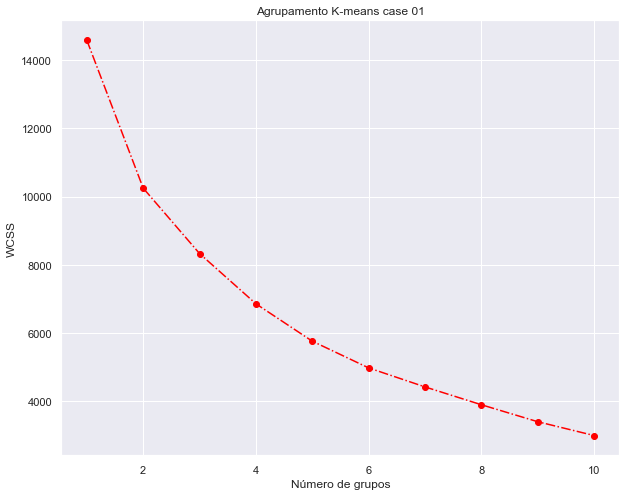

In [6]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    # inserir chamada ao K-means
    kmeans = KMeans(n_clusters=i, random_state=42)
    # agrupar
    kmeans.fit(case_1)
    # salvar resultado
    wcss.append(kmeans.inertia_)

plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Número de grupos')
plt.ylabel('WCSS')
plt.title('Agrupamento K-means case 01')
plt.show()

Mesmo dando 2 grupos foi definido que o mesmo devera ter 7 grupos!

In [7]:
n_cluster=7
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
kmeans.fit(case_1)
df_segm_kmeans = case_1_df.copy()
df_segm_kmeans = pd.DataFrame(data = case_1_df , columns = case_1_df.columns)
df_segm_kmeans['Grupo'] = kmeans.labels_ #atributo do modelo que informa os rótulos
df_segm_kmeans.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Grupo
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60,2
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47,2
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72,2
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91,2
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86,2


In [8]:
df_segm_analise = df_segm_kmeans.groupby(['Grupo'])
investimentos = df_segm_analise.size()
df_segm_analise = df_segm_analise.mean() # Inserir a métrica necessária = média
df_segm_analise['investimentos'] = investimentos
df_segm_analise.rename({0:'0', 1:'1', 2:'2', 3:'3',4:'4', 5:'5', 6:'6', 7:'7' }) # Adicione quantos forem necessários
df_segm_analise.head(7)

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Grupo,,,,,,,,,,
0,2.028846,38.706130,0.005409,0.090832,0.018731,0.178059,-0.014487,0.002053,435270.020928,1664
1,2.377172,817.565637,0.000000,0.144917,0.003720,54.189607,-0.000335,-0.000272,4133.869543,2072
2,3.578518,2.067839,0.000000,-0.182466,0.523027,-0.735029,-0.400804,0.061064,738.581495,796
3,2.511590,882.293463,0.000000,0.130906,0.001311,53.730980,-0.000030,-0.000350,9001.195205,2157
4,2.583974,1705.431760,0.984632,0.114027,0.005212,-215.907094,-0.000482,-0.000083,54461.672573,2733
5,1.675574,880.005157,0.058134,0.099311,0.001691,-509.681871,0.000000,-0.000198,11601.255320,2133
6,4.318267,17.525738,0.007847,-0.026404,0.144703,-0.400148,-0.163192,0.019950,47994.922960,3186


In [9]:
# Crie uma PCA de 3 componentes
from sklearn.decomposition import PCA
pca = PCA(n_components= 3)
pca.fit(case_1)
# Exiba os valores das componentes
print(pca.explained_variance_ratio_)

[0.35388288 0.16919959 0.12442745]


In [10]:
grupos_3d = pca.transform(case_1) # Método de transformação da PCA
grupos_3d.shape
grupos_df_3d = pd.DataFrame(grupos_3d).loc[:,:2]
grupos_df_3d.columns = ['PC1','PC2','PC3']
grupos_df_3d.head(7)

,PC1,PC2,PC3
0,0.235918,-0.012634,-0.504028
1,0.293153,-0.104900,-0.475870
2,0.177701,0.094935,-0.506706
3,0.136961,0.124111,-0.480181
4,0.240700,-0.020393,-0.503735
5,0.207115,0.026278,-0.484519
6,0.221605,0.027740,-0.504794


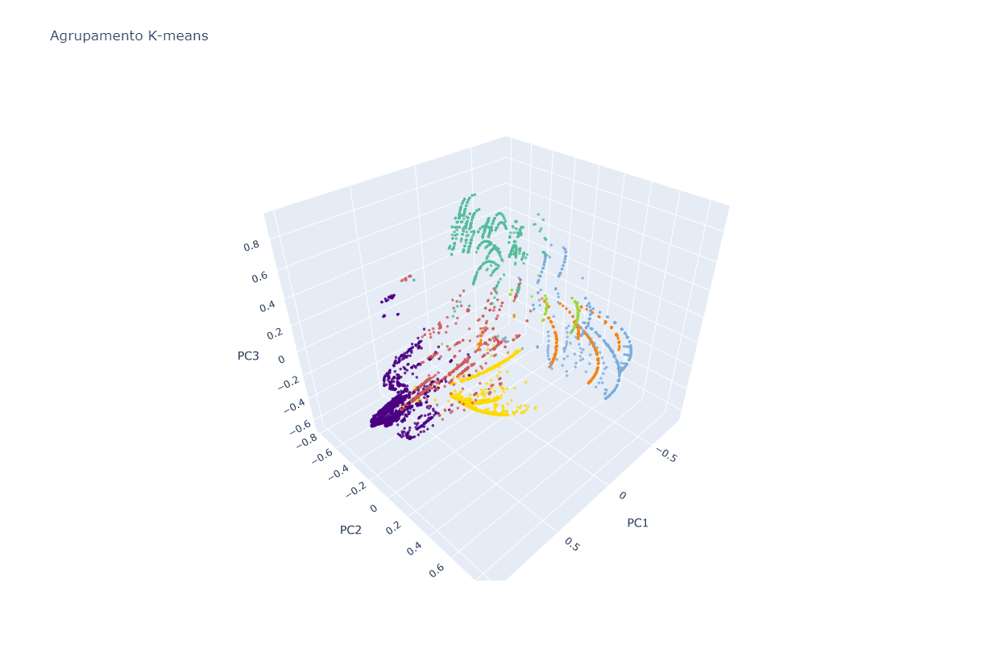

In [11]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>  '''))
  init_notebook_mode(connected=False)
  
  
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import plotly.offline as py
import plotly.graph_objs as go

trace1 = go.Scatter3d(
    x=grupos_df_3d["PC1"],
    y=grupos_df_3d["PC2"],
    z=grupos_df_3d["PC3"],
    mode='markers',
    text= kmeans.labels_,
    marker=dict(
        size=2,
        color= kmeans.labels_,         
        colorscale=[[0.0,"indianred"],[0.2,"darkorange"],[0.4,"yellow"],[0.6,"mediumseagreen"],[0.8,"skyblue"],[1.0, "indigo"]],
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Agrupamento K-means",
    scene = dict(
        xaxis = dict(title="PC1"),
        yaxis = dict(title="PC2"),
        zaxis = dict(title="PC3")
    ),
    width=800,
    height=800
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

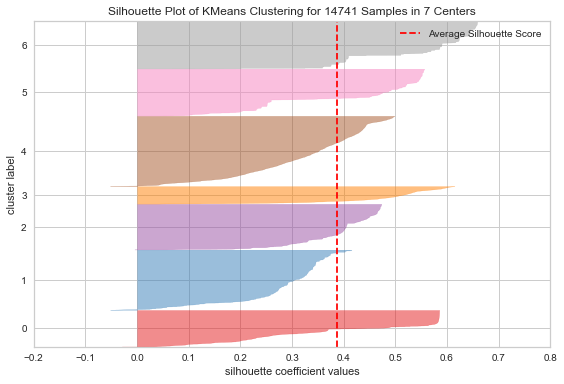

In [12]:
# SilhouetteVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
n_clusters = 7 # Número de grupos que escolhemos
sil = SilhouetteVisualizer(KMeans(n_clusters)) # Método SilhouetteVisualizer
sil.fit(case_1)
sil.finalize()
plt.tight_layout()
plt.show()

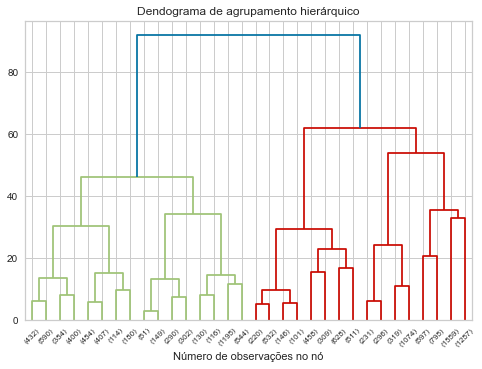

In [13]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

# Consultar a scikit para encontrar o método de agrupamento acumulativo
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

dend = AgglomerativeClustering(distance_threshold=0, n_clusters= None) # Chamada do método
dend = dend.fit(case_1)
plt.title("Dendograma de agrupamento hierárquico")
plot_dendrogram(dend, truncate_mode="level", p=4)
plt.xlabel("Número de observações no nó")
plt.show()

Analise por grupo

In [14]:
df_case1= df_segm_kmeans
df_mask0= df_case1['Grupo']== 0
df_case1= df_segm_kmeans
df_mask1= df_case1['Grupo']== 1
df_case1= df_segm_kmeans
df_mask2= df_case1['Grupo']== 2
df_case1= df_segm_kmeans
df_mask3= df_case1['Grupo']== 3
df_case1= df_segm_kmeans
df_mask4= df_case1['Grupo']== 4
df_case1= df_segm_kmeans
df_mask5= df_case1['Grupo']== 5
df_case1= df_segm_kmeans
df_mask6= df_case1['Grupo']== 6

filtered_df0 = df_case1[df_mask0]
filtered_df1 = df_case1[df_mask1]
filtered_df2 = df_case1[df_mask2]
filtered_df3 = df_case1[df_mask3]
filtered_df4 = df_case1[df_mask4]
filtered_df5 = df_case1[df_mask5]
filtered_df6 = df_case1[df_mask6]

from pandas_profiling import ProfileReport
profile = ProfileReport(filtered_df0, minimal=True, title='case1_grupo0', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case1_grupo0.html") 
profile = ProfileReport(filtered_df1, minimal=True, title='case1_grupo1', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case1_grupo1.html") 
profile = ProfileReport(filtered_df2, minimal=True, title='case1_grupo2', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case1_grupo2.html") 
profile = ProfileReport(filtered_df3, minimal=True, title='case1_grupo3', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case1_grupo3.html") 
profile = ProfileReport(filtered_df4, minimal=True, title='case1_grupo4', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case1_grupo4.html") 
profile = ProfileReport(filtered_df5, minimal=True, title='case1_grupo5', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case1_grupo5.html") 
profile = ProfileReport(filtered_df6, minimal=True, title='case1_grupo6', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case1_grupo6.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]